# Stroke Prediction

This notebook is used for exploratory analysis and prediction of stroke in people with different genetic and environmental traits.

## Table of contents:

1. Introduction
2. Exploration
3. Pre-processing
4. Modeling
5. Evaluation & Comparison
6. Conclusion


## Introduction

The dataset that was provided includes the following columns:

1. id: unique identifier 
2. gender: "Male", "Female" or "Other"
3. age: age of the patient
4. hypertension: 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
5. heart_disease: 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
6. ever_married: "No" or "Yes"
7. work_type: "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"
8. Residence_type: "Rural" or "Urban"
9. avg_glucose_level: average glucose level in blood
10. bmi: body mass index
11. smoking_status: "formerly smoked", "never smoked", "smokes" or "Unknown"*
12. stroke: 1 if the patient had a stroke or 0 if not

What we want to achieve is predicting the stroke value using the features provided, that is, implementing a binary classification algorithm. Let's dig into it.

## Libraries and configuration

In [71]:
%load_ext autoreload

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn. import 

sns.set()
plt.style.use('seaborn-darkgrid')

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Loading Data

In [72]:

data_file = 'healthcare-dataset-stroke-data.csv'
df = pd.read_csv(data_file)

## Exploratory data analysis

In [73]:
print(df.info())
print()
print(df.sample(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB
None

         id  gender    age  hypertension  heart_disease ever_married  \
3725  24202    Male  63.00             0              0          Yes   
1976  4

In our immediate exploration, we see that we have numerical features as well as categorical ones (text features and integer categories). Also, the bmi column includes some null values which needs to be handled. 
Let's see the general statistical metrics for the data we have and how they are distrubuted individually.

In [74]:
# Dropping the id colum as it doesn't provide any info
df.drop(['id'], axis=1, inplace=True)

df.bmi.fillna(df.bmi.mean(), inplace=True)

df_shape = df.shape
df_columns = list(df.columns)
df.describe().T

In [75]:
The general statistics of the data does not show us the whole picture in most cases and a deeper understanding the distrubution of the data is nedded. 
Let us visualize the distrubutions using bar charts and histograms.

,count,mean,std,min,25%,50%,75%,max
age,5110.0,43.226614,22.612647,0.08,25.000,45.000,61.00,82.00
hypertension,5110.0,0.097456,0.296607,0.00,0.000,0.000,0.00,1.00
heart_disease,5110.0,0.054012,0.226063,0.00,0.000,0.000,0.00,1.00
avg_glucose_level,5110.0,106.147677,45.283560,55.12,77.245,91.885,114.09,271.74
bmi,5110.0,28.893237,7.698018,10.30,23.800,28.400,32.80,97.60
stroke,5110.0,0.048728,0.215320,0.00,0.000,0.000,0.00,1.00


fig=plt.figure(figsize=(20,20), dpi= 100, facecolor='w', edgecolor='k')

for i in range(df_shape[1]):
    plt.subplot(3,4, i+1)
    # Continuous values will be plotted with histograms, discrete values will be plotted with bar chart
    if df[df_columns[i]].dtype == np.float64: 
        ax = df[df_columns[i]].plot(kind = 'hist', fontsize = 15)
    else:
        ax = df[df_columns[i]].value_counts().sort_values().plot(kind = 'bar', fontsize = 15)
    ax.title.set_text([df_columns[i]])

plt.show()

/Users/icarus/anaconda3/envs/stroke-prediction/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/Users/icarus/anaconda3/envs/stroke-prediction/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/Users/icarus/anaconda3/envs/stroke-prediction/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/Users/icarus/anaconda

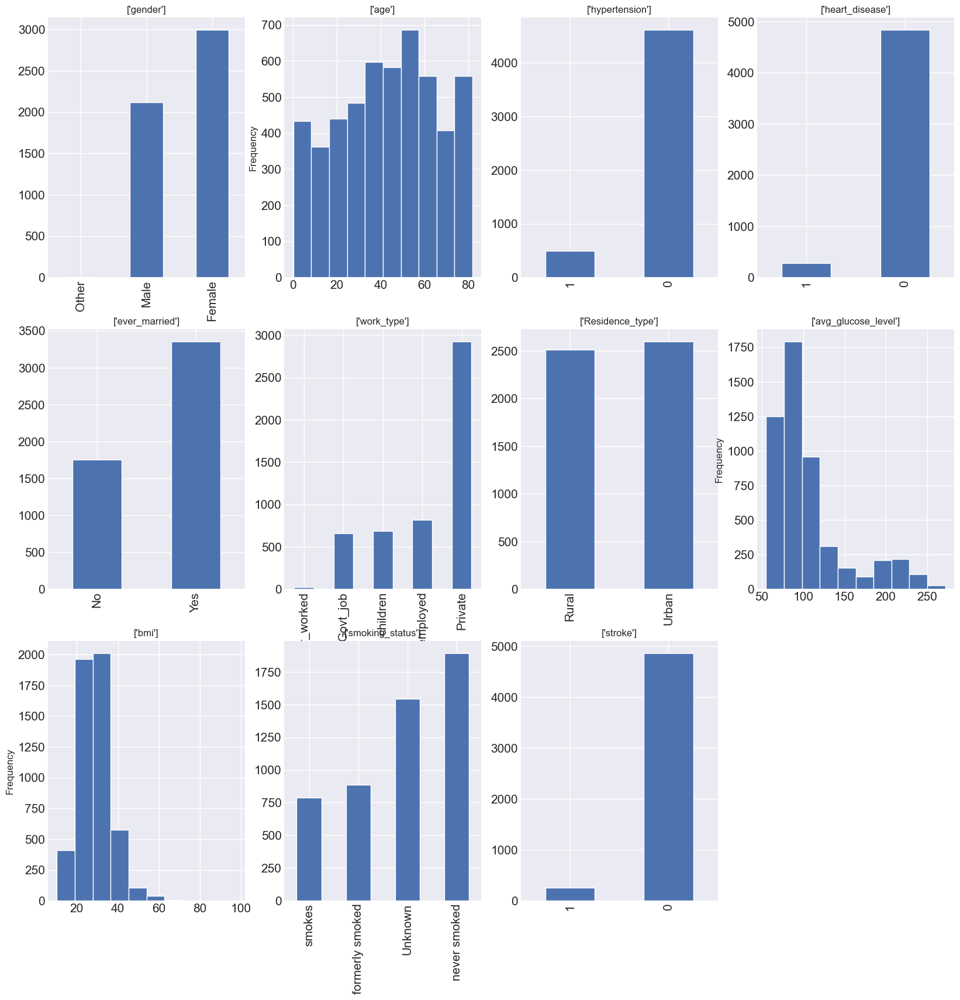

In [76]:
It was seen that the data is not evenly distrubuted for the dependent variable, ie. the dataset is imbalanced for the target feature. This can be a problem for the classification models we will implement, as the overrepresented data may skew the prediction results.
The pie chart below shows that 95% of the people in this data did not have stroke. So we would have 95% accuracy for a classification method that always assigns 'not stroke'.

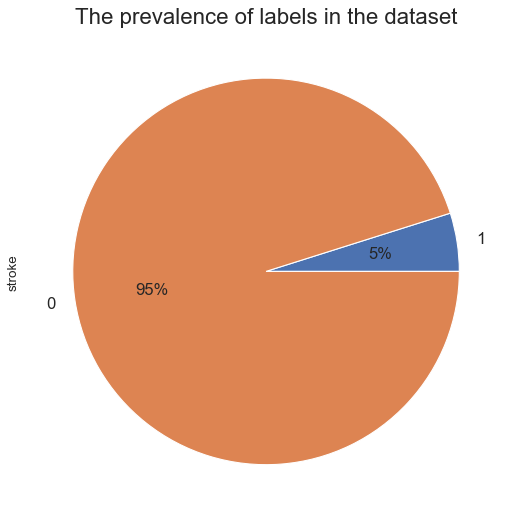

In [77]:
fig=plt.figure(figsize=(12,8), dpi= 80, facecolor='w', edgecolor='k')

df.stroke.value_counts().sort_values().plot(kind = 'pie', autopct='%1.0f%%', fontsize = 15)
plt.title('The prevalence of labels in the dataset', fontsize = 20)
plt.show()

## Pre-processing

The first preprocessing we need to do is converting the text features to their numeric counterparts. We can do that through binary encoding (if the feature has just two possible values, ie. `ever_married`) or one hot encoding (if the feature can have one of many values, ie. `smoking_status`)

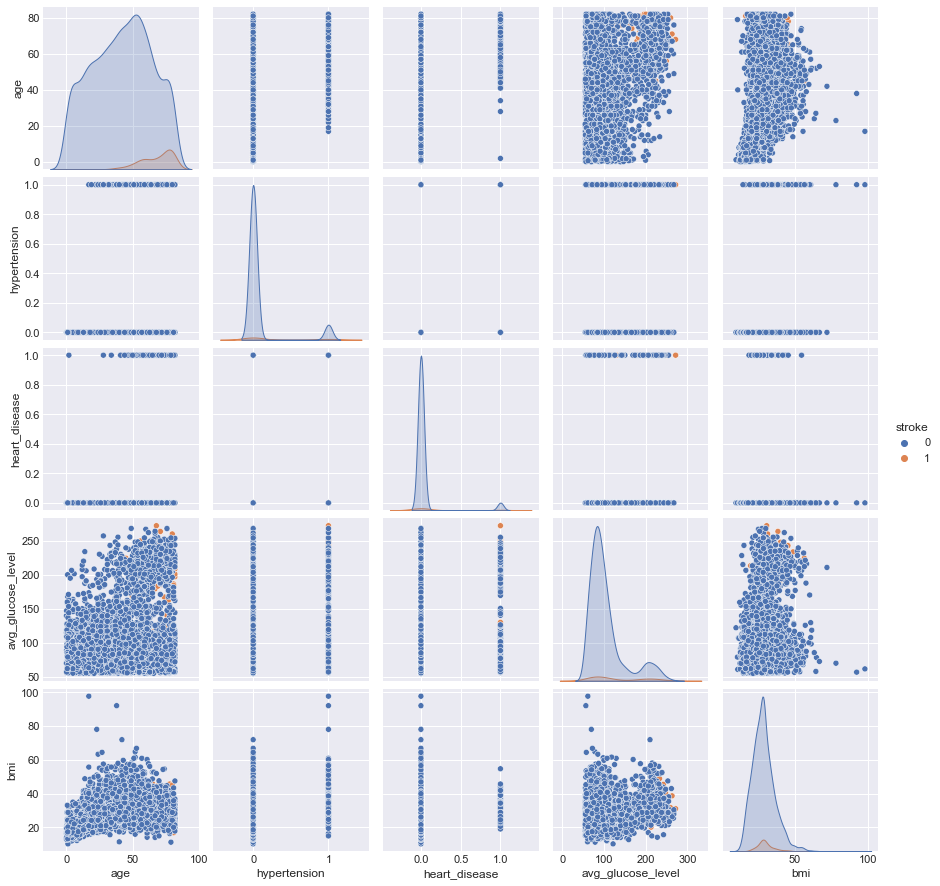

In [78]:
sns.pairplot(df, hue= 'stroke')
plt.show()